In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from CSIKit.util import csitools
from CSIKit.reader import get_reader

<h3>Load pcap/csv files</h3>

In [2]:
actvs = ('brushteeth', 'cook', 'drink', 'getintobed', 'nothing', 'sitdown_chair', 'sitdown_sofa',
         'sleeping', 'standup_chair', 'standup_sofa', 'walk', 'washingdishes')


path_pcap = os.getcwd() + "\samsung_csi_data_pcap"
data_pcap = []

path_csv = os.getcwd() + "\samsung_csi_data_csv"
data_csv = []


for act in actvs:
    lst_pcap = glob.glob(f'samsung_csi_data_pcap/{act}*')[:5]
    lst_csv = glob.glob(f'samsung_csi_data_csv/{act}*')[:5]

    temp = []
    for f in lst_pcap:
        fname = os.path.basename(f)
        fpath = os.path.join(path_pcap, fname)
        my_reader = get_reader(fpath)
        csi_data = my_reader.read_file(fpath)
        temp.append((fname[:-5], csi_data))
    data_pcap.append(temp)

    temp = []
    for f in lst_csv:
        fname = os.path.basename(f)
        fpath = os.path.join(path_csv, fname)
        data = pd.read_csv(fpath)
        temp.append((fname[:-4], data))
    data_csv.append(temp)

In [3]:
def plot_heatmap(csi_matrix, timestamps, ax, filename):

        csi_matrix = np.transpose(csi_matrix)

        x_label = "Time (s)"
        try:
            x = timestamps
            x = [timestamp - x[0] for timestamp in x]
        except AttributeError as e:
            # No timestamp in frame. Likely an IWL entry.
            # Will be moving timestamps to CSIData to account for this.
            x = [0]

        if sum(x) == 0:
            # Some files have invalid timestamp_low values which means we can't plot based on timestamps.
            # Instead we'll just plot by frame count.

            xlim = csi_matrix.shape[1]

            x_label = "Frame No."
        else:
            xlim = max(x)

        limits = [0, xlim, 1, csi_matrix.shape[0]]

        # _, ax = plt.subplots()
        im = ax.imshow(csi_matrix, cmap="jet", extent=limits, aspect="auto")
        ax.set_title(filename, color='dimgrey')

        cbar = ax.figure.colorbar(im, ax=ax)
        cbar.ax.set_ylabel("Amplitude (dBm)")

        ax.set_xlabel(x_label)
        ax.set_ylabel("Subcarrier Index")

        # plt.title("CSI Amplitude Heatmap Plot")

        # plt.show()

<h3>Heatmap</h3>
Of 5 files for each activity

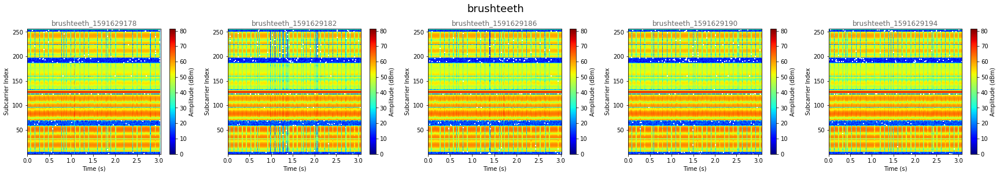

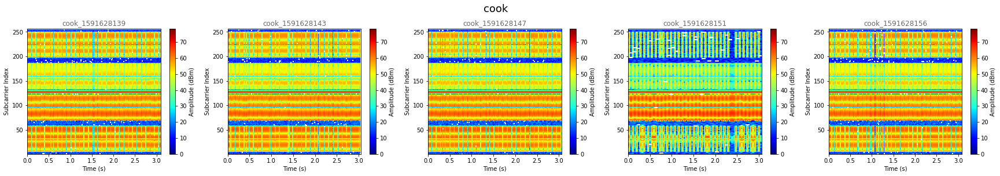

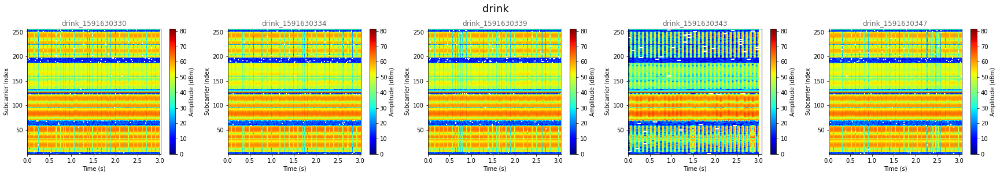

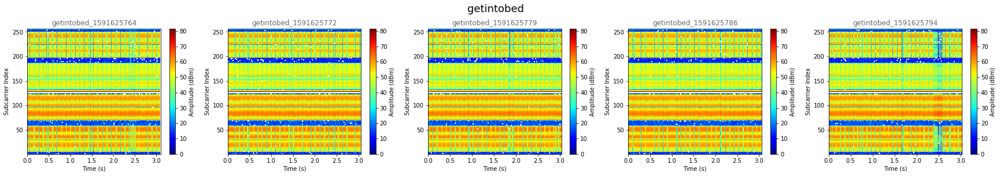

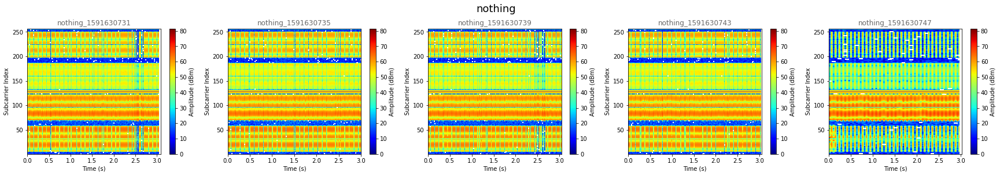

...

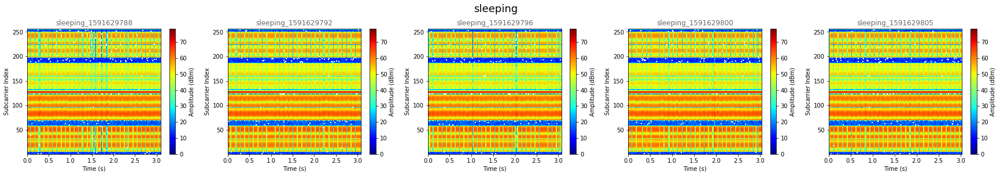

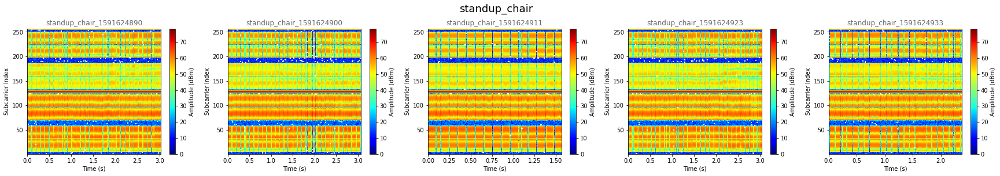

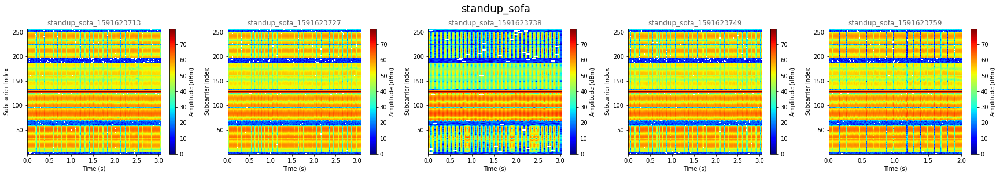

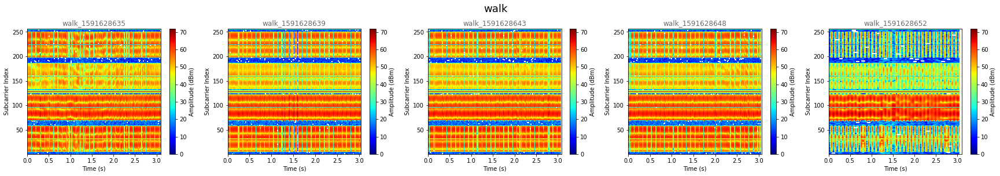

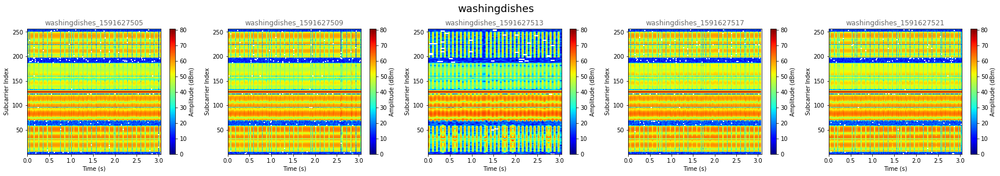

In [4]:
for i, act in enumerate(data_pcap):
    fig, axs = plt.subplots(1, 5, figsize=(30, 4))
    fig.suptitle(actvs[i], fontsize=18, y=1.03)

    for j, (fname, data) in enumerate(act):
        csi_matrix, no_frames, no_subcarriers = csitools.get_CSI(data, metric="amplitude")
        csi_matrix_first = csi_matrix[:, :, 0, 0]
        csi_matrix_squeezed = np.squeeze(csi_matrix_first)
        plot_heatmap(csi_matrix_squeezed, data.timestamps, axs[j], fname)
        
    plt.show()

<h3>DotPlot</h3>

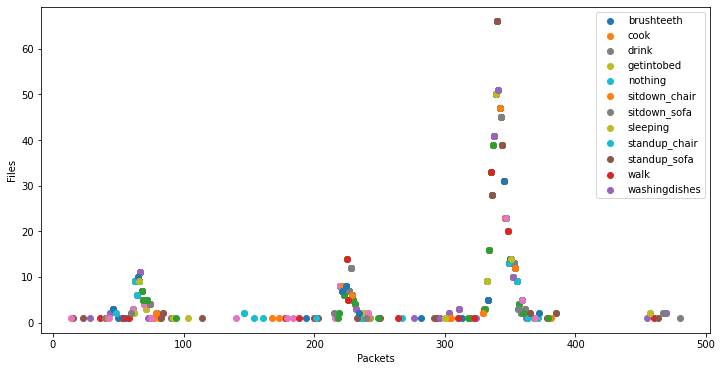

In [5]:
plt.figure(figsize=(12, 6))
data_len = []

for act in actvs:
    lst = glob.glob(f'samsung_csi_data_csv/{act}*')
    temp = []
    
    for f in lst:
        fpath = os.getcwd() + f'\{f}'
        temp.append(len(pd.read_csv(fpath)))

    data_len.append(temp)


data_len_flat = [j for i in data_len for j in i]

for i, act in enumerate(data_len):
    for l in act:
        c = data_len_flat.count(l)
        plt.scatter(l, c)
    plt.scatter(l, c, label=actvs[i])


plt.legend()
plt.xlabel('Packets')
plt.ylabel('Files')
plt.show()

<h3>Correlation</h3>
Of 5 files for each activity

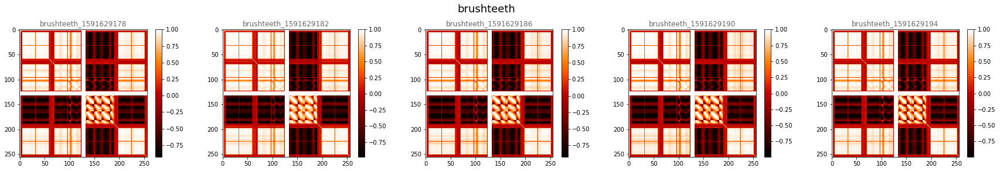

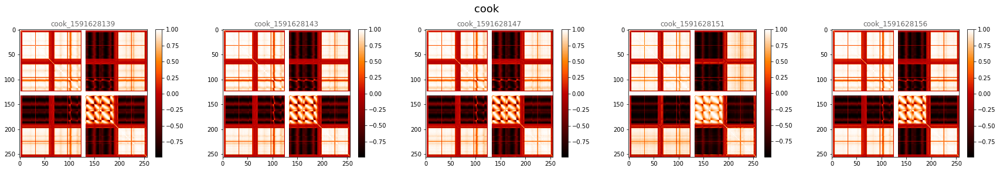

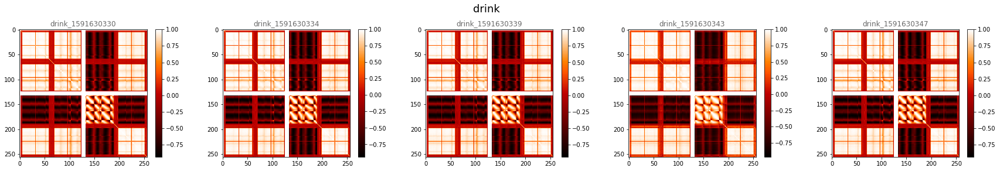

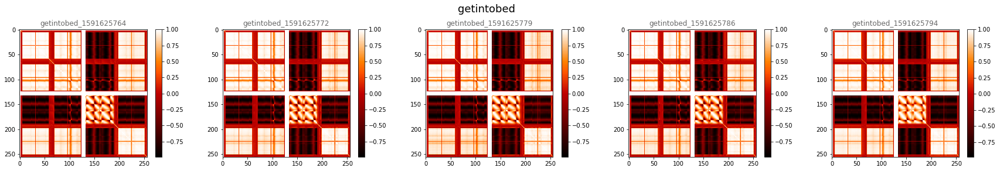

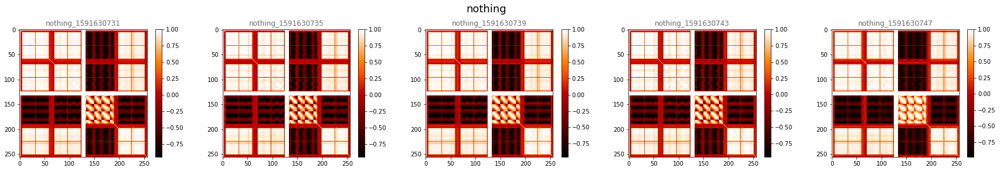

...

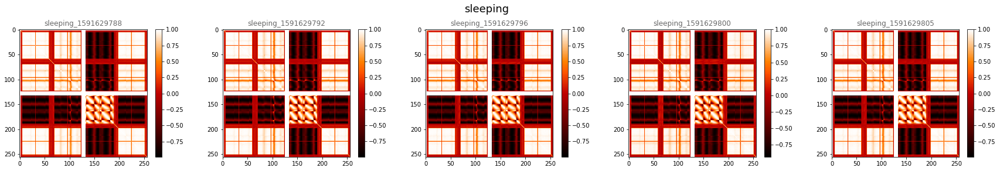

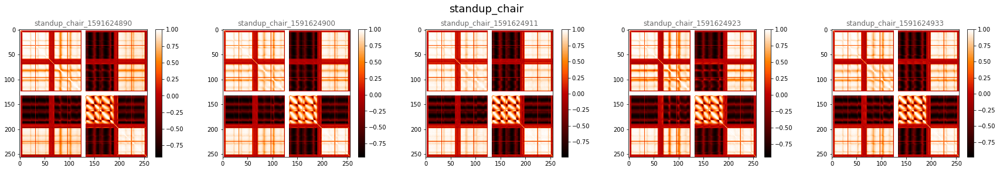

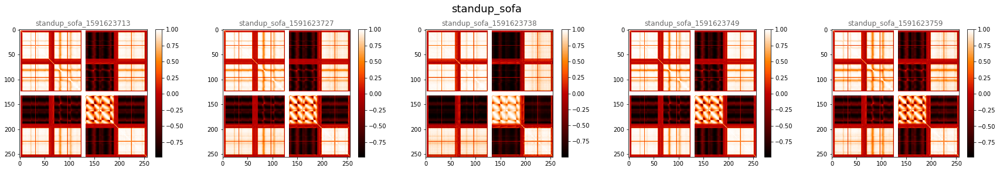

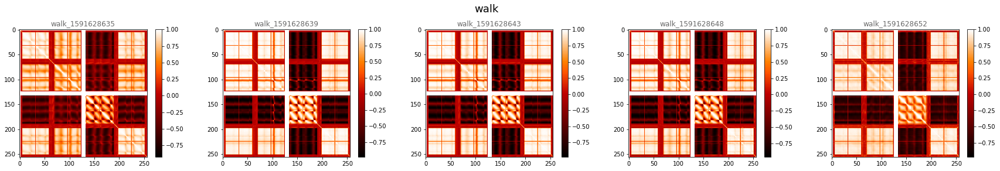

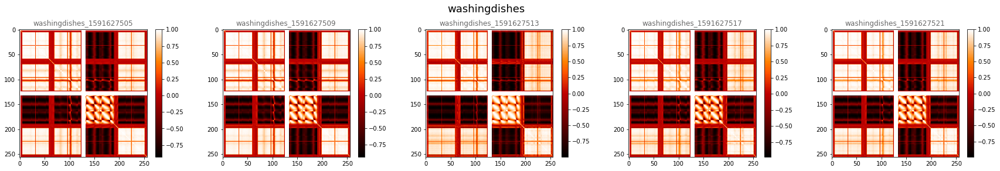

In [6]:
for i, act in enumerate(data_csv):
    fig, axs = plt.subplots(1, 5, figsize=(30, 4))
    fig.suptitle(actvs[i], fontsize=18, y=1.03)

    for j, (fname, data) in enumerate(act):
        im = axs[j].imshow(data.corr(), cmap='gist_heat')
        axs[j].set_title(fname, color='dimgrey')
        cbar = axs[j].figure.colorbar(im, ax=axs[j])
        
    plt.show()

<h3>Packets LinePlot</h3>
First packet of first file for each activity

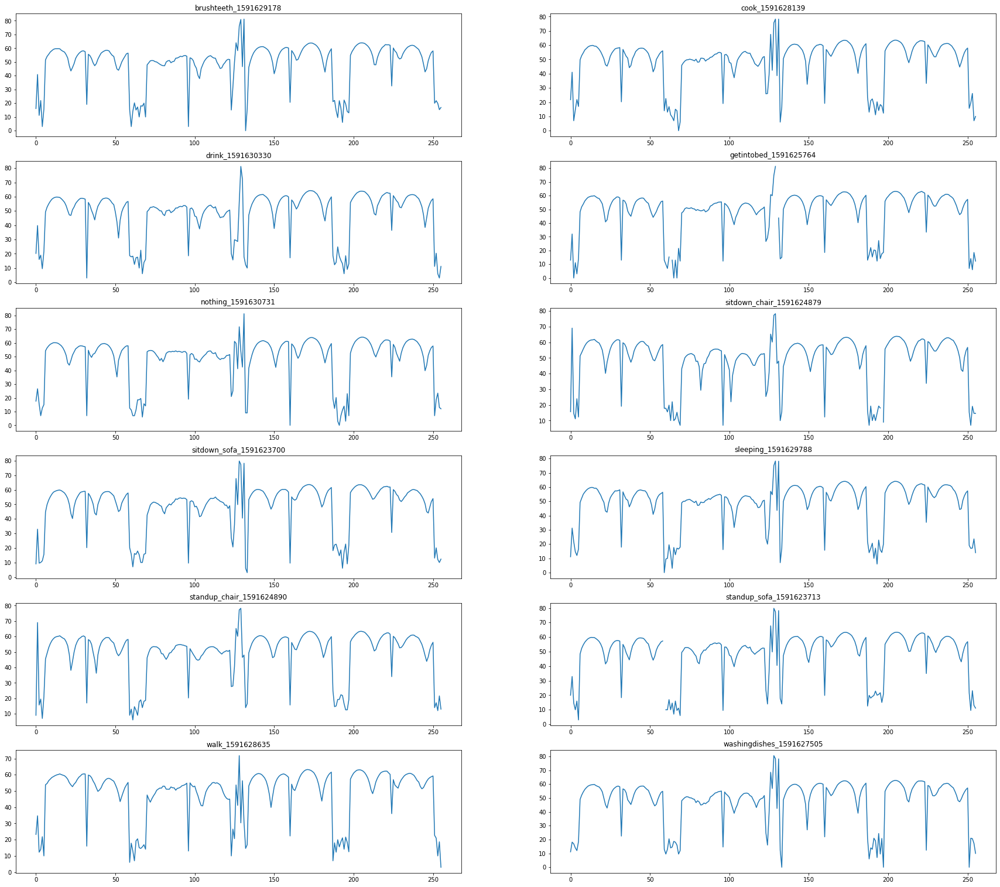

In [7]:
fig, axs = plt.subplots(6, 2, figsize=(30, 27))
i = 0
j = 0

for act in data_csv:
    ax = axs[i, j % 2]
    ax.plot(act[0][1].iloc[0])
    ax.set_xticks(np.arange(0, 257, 50))
    ax.set_title(act[0][0])
    i += 1 if j % 2 else 0
    j += 1

plt.show()

<h3>Subcarriers LinePlot</h3>
10 subcarriers of first file for each activity

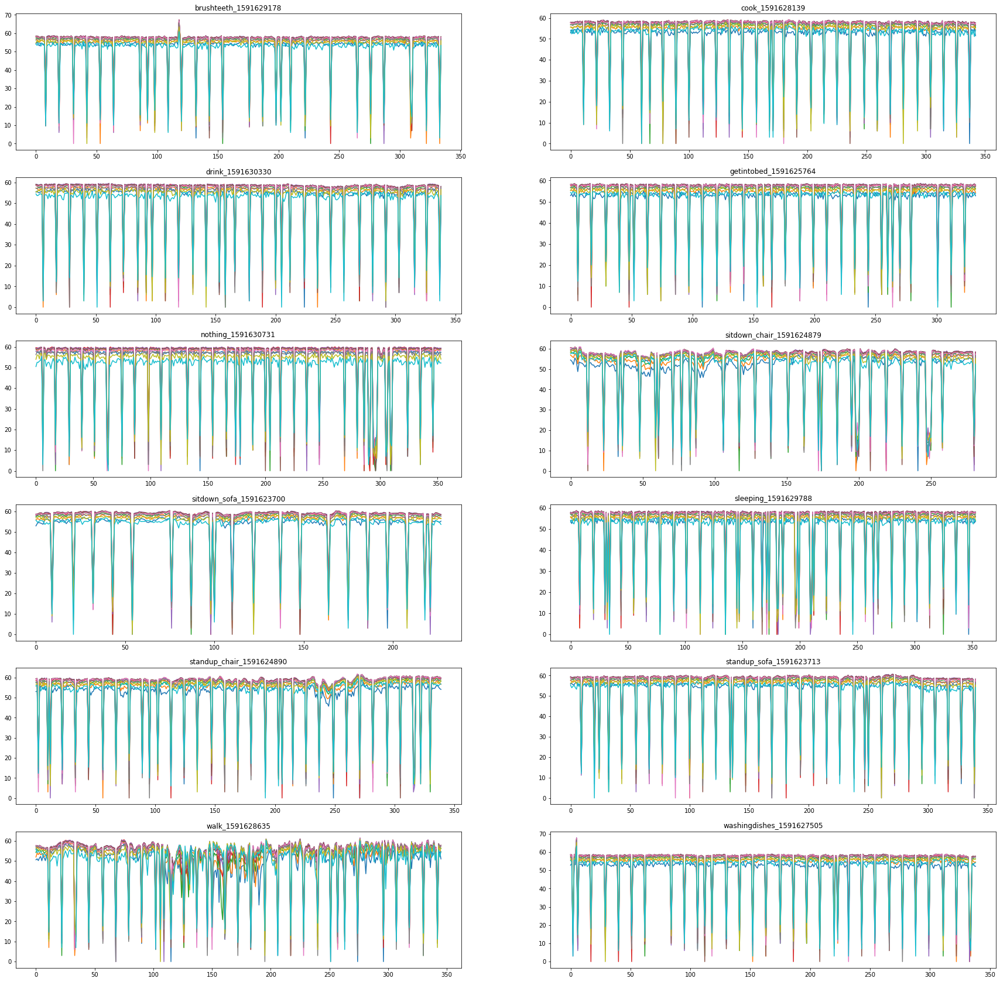

In [8]:
fig, axs = plt.subplots(6, 2, figsize=(30, 30))
i = 0
j = 0

for n, act in enumerate(data_csv):
    ax = axs[i, j % 2]
    for k in range(40, 50): ax.plot(act[0][1][f'{k}'])
    ax.set_title(act[0][0])
    i += 1 if j % 2 else 0
    j += 1

plt.show()